# Welcome to the Second Part in Our Zimbabwe Covid Digital Case Study Series
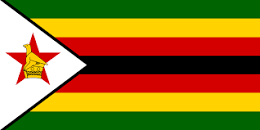

On 16 March 2020 The Ministry of Health in Zimbabwe Reported that a traveller who had been to Zimbabwe between 7 and 10 March, fell ill and had later returned to the United Kingdom via South Africa had tested Covid-19 positive in the UK.Four days later Zimbabwe reported its first Confirmed Covid_19 Case on 20 March.This notebook shows all the reported cases in Zimbabwe to date

# We will start by reading the zdf dataframe which we pickled earlier

In [1]:
import pandas as pd
# read the pickled zdf
zdf = pd.read_pickle('Data/Zimbabwe/zdf_pickle.pkl')
zdf

,Province,Confirmed_Cases,Deaths
0,Bulawayo,58,1
1,Harare,172,3
2,Manicaland,19,0
3,Mashonaland Central,9,0
4,Mashonaland East,47,0
5,Mashonaland West,27,1
6,Masvingo,50,0
7,Matabeleland North,11,0
8,Matabeleland South,46,0
9,Midlands,40,0


# Create Bar Chart Visualization for zdf

In [2]:
import plotly.express as px
zdf = zdf
fig = px.bar(zdf, x='Province', y='Confirmed_Cases', title='Distribution of Zimbabwe Covid Cases')
fig.show()

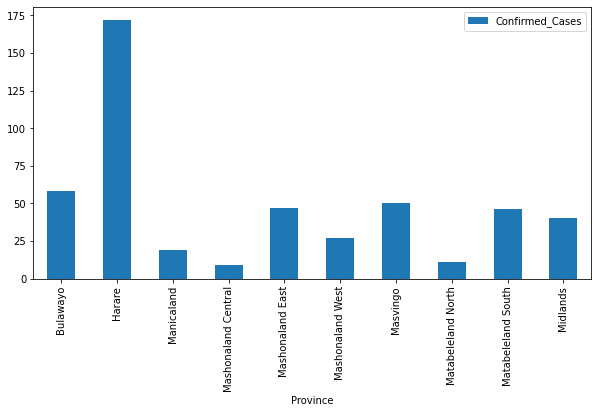

In [3]:
# plot bar graph
zdf.plot.bar(y = 'Confirmed_Cases', x= 'Province', figsize=(10,5))

In [4]:
import geopandas as gpd

In [5]:
# create Zimbabwe shapefile geodataframe and assign it to the variable zgdf
zgdf = gpd.read_file('Data/Zimbabwe/Zimbabwe_PROD_4_Province_ProvinceLsib_2016_Sept.shp')
zgdf

,level4name,uid,LON,LAT,LANDSCAN18,CENSUS2012,HASC1,FIPS,AREASQKM,AREASQMI,CAPITAL,geometry
0,Bulawayo,Gq3yijKpYtE,28.548115,-20.140592,687429,653337,ZW.BU,ZI09,479.0,185.0,Bulawayo,"POLYGON ((28.61305 -20.23587, 28.60440 -20.225..."
1,Harare,N3hBufW5udb,31.065045,-17.859328,2259064,2123132,ZW.HA,ZI10,872.0,337.0,Harare,"POLYGON ((31.08852 -17.66625, 31.11038 -17.667..."
2,Manicaland,ZyJ62ad8arA,32.399901,-19.060725,1880476,1752698,ZW.MA,ZI01,36459.0,14077.0,Mutare,"POLYGON ((32.99392 -17.56108, 33.00091 -17.565..."
3,Mashonaland Central,qvhPwMGUgmP,31.189823,-16.701566,1241574,1152520,ZW.MC,ZI03,28347.0,10945.0,Bindura,"MULTIPOLYGON (((32.72578 -16.68966, 32.73944 -..."
4,Mashonaland East,VgWQIctY7iL,31.694915,-17.984395,1423794,1344955,ZW.ME,ZI04,32230.0,12444.0,Marondera,"POLYGON ((32.77036 -16.70624, 32.77755 -16.707..."
5,Mashonaland West,Xkfs44Or8VB,29.707166,-17.181525,1651222,1501656,ZW.MW,ZI05,57441.0,22178.0,Chinhoyi,"POLYGON ((29.98200 -15.64157, 29.98512 -15.642..."
6,Masvingo,ilghQXI6qYq,31.243006,-20.784325,1592762,1485090,ZW.MV,ZI08,56566.0,21840.0,Masvingo,"POLYGON ((30.96762 -19.15971, 30.98009 -19.161..."
7,Matabeleland North,JAyjF08jkOy,27.402758,-18.824802,820768,749017,ZW.MN,ZI06,75025.0,28967.0,Lupane,"POLYGON ((28.05612 -17.05775, 28.05182 -17.058..."
8,Matabeleland South,hb829DJhS1q,28.992982,-21.009559,737178,683893,ZW.MS,ZI07,54172.0,20916.0,Gwanda,"POLYGON ((29.27012 -19.51698, 29.27394 -19.525..."
9,Midlands,i0ugMWVcB6M,29.465823,-18.980177,1737465,1614941,ZW.MI,ZI02,49166.0,18983.0,Gweru,"POLYGON ((28.92984 -17.12849, 28.93361 -17.133..."


In [6]:
zdf.columns = ['level4name', 'Confirmed_Cases', 'Deaths']
zdf

,level4name,Confirmed_Cases,Deaths
0,Bulawayo,58,1
1,Harare,172,3
2,Manicaland,19,0
3,Mashonaland Central,9,0
4,Mashonaland East,47,0
5,Mashonaland West,27,1
6,Masvingo,50,0
7,Matabeleland North,11,0
8,Matabeleland South,46,0
9,Midlands,40,0


# Create a bubble Visualization to show deaths and cases in Zimbabwe using plotly

In [7]:
import plotly.express as px

fig = px.scatter(zdf, x="Deaths", y="Confirmed_Cases",
             size="Confirmed_Cases", color="level4name",
                 hover_name="level4name", log_x=True, size_max=30)
fig.show()

In [8]:
zim_shapes = zgdf.merge(zdf, on='level4name')
zim_shapes

,level4name,uid,LON,LAT,LANDSCAN18,CENSUS2012,HASC1,FIPS,AREASQKM,AREASQMI,CAPITAL,geometry,Confirmed_Cases,Deaths
0,Bulawayo,Gq3yijKpYtE,28.548115,-20.140592,687429,653337,ZW.BU,ZI09,479.0,185.0,Bulawayo,"POLYGON ((28.61305 -20.23587, 28.60440 -20.225...",58,1
1,Harare,N3hBufW5udb,31.065045,-17.859328,2259064,2123132,ZW.HA,ZI10,872.0,337.0,Harare,"POLYGON ((31.08852 -17.66625, 31.11038 -17.667...",172,3
2,Manicaland,ZyJ62ad8arA,32.399901,-19.060725,1880476,1752698,ZW.MA,ZI01,36459.0,14077.0,Mutare,"POLYGON ((32.99392 -17.56108, 33.00091 -17.565...",19,0
3,Mashonaland Central,qvhPwMGUgmP,31.189823,-16.701566,1241574,1152520,ZW.MC,ZI03,28347.0,10945.0,Bindura,"MULTIPOLYGON (((32.72578 -16.68966, 32.73944 -...",9,0
4,Mashonaland East,VgWQIctY7iL,31.694915,-17.984395,1423794,1344955,ZW.ME,ZI04,32230.0,12444.0,Marondera,"POLYGON ((32.77036 -16.70624, 32.77755 -16.707...",47,0
5,Mashonaland West,Xkfs44Or8VB,29.707166,-17.181525,1651222,1501656,ZW.MW,ZI05,57441.0,22178.0,Chinhoyi,"POLYGON ((29.98200 -15.64157, 29.98512 -15.642...",27,1
6,Masvingo,ilghQXI6qYq,31.243006,-20.784325,1592762,1485090,ZW.MV,ZI08,56566.0,21840.0,Masvingo,"POLYGON ((30.96762 -19.15971, 30.98009 -19.161...",50,0
7,Matabeleland North,JAyjF08jkOy,27.402758,-18.824802,820768,749017,ZW.MN,ZI06,75025.0,28967.0,Lupane,"POLYGON ((28.05612 -17.05775, 28.05182 -17.058...",11,0
8,Matabeleland South,hb829DJhS1q,28.992982,-21.009559,737178,683893,ZW.MS,ZI07,54172.0,20916.0,Gwanda,"POLYGON ((29.27012 -19.51698, 29.27394 -19.525...",46,0
9,Midlands,i0ugMWVcB6M,29.465823,-18.980177,1737465,1614941,ZW.MI,ZI02,49166.0,18983.0,Gweru,"POLYGON ((28.92984 -17.12849, 28.93361 -17.133...",40,0


In [9]:
zim_shapes1 = zim_shapes[(zim_shapes.Confirmed_Cases != 0)]
zim_shapes1

,level4name,uid,LON,LAT,LANDSCAN18,CENSUS2012,HASC1,FIPS,AREASQKM,AREASQMI,CAPITAL,geometry,Confirmed_Cases,Deaths
0,Bulawayo,Gq3yijKpYtE,28.548115,-20.140592,687429,653337,ZW.BU,ZI09,479.0,185.0,Bulawayo,"POLYGON ((28.61305 -20.23587, 28.60440 -20.225...",58,1
1,Harare,N3hBufW5udb,31.065045,-17.859328,2259064,2123132,ZW.HA,ZI10,872.0,337.0,Harare,"POLYGON ((31.08852 -17.66625, 31.11038 -17.667...",172,3
2,Manicaland,ZyJ62ad8arA,32.399901,-19.060725,1880476,1752698,ZW.MA,ZI01,36459.0,14077.0,Mutare,"POLYGON ((32.99392 -17.56108, 33.00091 -17.565...",19,0
3,Mashonaland Central,qvhPwMGUgmP,31.189823,-16.701566,1241574,1152520,ZW.MC,ZI03,28347.0,10945.0,Bindura,"MULTIPOLYGON (((32.72578 -16.68966, 32.73944 -...",9,0
4,Mashonaland East,VgWQIctY7iL,31.694915,-17.984395,1423794,1344955,ZW.ME,ZI04,32230.0,12444.0,Marondera,"POLYGON ((32.77036 -16.70624, 32.77755 -16.707...",47,0
5,Mashonaland West,Xkfs44Or8VB,29.707166,-17.181525,1651222,1501656,ZW.MW,ZI05,57441.0,22178.0,Chinhoyi,"POLYGON ((29.98200 -15.64157, 29.98512 -15.642...",27,1
6,Masvingo,ilghQXI6qYq,31.243006,-20.784325,1592762,1485090,ZW.MV,ZI08,56566.0,21840.0,Masvingo,"POLYGON ((30.96762 -19.15971, 30.98009 -19.161...",50,0
7,Matabeleland North,JAyjF08jkOy,27.402758,-18.824802,820768,749017,ZW.MN,ZI06,75025.0,28967.0,Lupane,"POLYGON ((28.05612 -17.05775, 28.05182 -17.058...",11,0
8,Matabeleland South,hb829DJhS1q,28.992982,-21.009559,737178,683893,ZW.MS,ZI07,54172.0,20916.0,Gwanda,"POLYGON ((29.27012 -19.51698, 29.27394 -19.525...",46,0
9,Midlands,i0ugMWVcB6M,29.465823,-18.980177,1737465,1614941,ZW.MI,ZI02,49166.0,18983.0,Gweru,"POLYGON ((28.92984 -17.12849, 28.93361 -17.133...",40,0


In [10]:
zim_shapes2 = zim_shapes[(zim_shapes.Deaths != 0)]
zim_shapes2

,level4name,uid,LON,LAT,LANDSCAN18,CENSUS2012,HASC1,FIPS,AREASQKM,AREASQMI,CAPITAL,geometry,Confirmed_Cases,Deaths
0,Bulawayo,Gq3yijKpYtE,28.548115,-20.140592,687429,653337,ZW.BU,ZI09,479.0,185.0,Bulawayo,"POLYGON ((28.61305 -20.23587, 28.60440 -20.225...",58,1
1,Harare,N3hBufW5udb,31.065045,-17.859328,2259064,2123132,ZW.HA,ZI10,872.0,337.0,Harare,"POLYGON ((31.08852 -17.66625, 31.11038 -17.667...",172,3
5,Mashonaland West,Xkfs44Or8VB,29.707166,-17.181525,1651222,1501656,ZW.MW,ZI05,57441.0,22178.0,Chinhoyi,"POLYGON ((29.98200 -15.64157, 29.98512 -15.642...",27,1


# We will Create a base map of Zimbabwe first

In [11]:
# import folium package then use Masvingo coordinates to center the map
import folium 
folium.__version__
Masvingo_Coordinates = (-20.784325,31.243006)

map1 = folium.Map(location=Masvingo_Coordinates, zoom_start=6)
map1

# We will now plot the Confirmed Cases In Zimbabwe
We will use the Cartodbpositron tilelayer for amplified cognition and we will make use of circle markers with a raduis proportional to the magnitude of cases

In [12]:
import folium 
folium.__version__

map2 = folium.Map(location=Masvingo_Coordinates, zoom_start=6)

folium.TileLayer('cartodbpositron').add_to(map2)


for index, row in zim_shapes1.iterrows():
    province = row['level4name']
    lat = row['LAT']
    lon = row['LON']
    Confirmed = row['Confirmed_Cases']
    popup_string = '<b>'+province.upper() +'</b> <br/>Location: '+'('+str(lat)+\
                     ', '+str(lon)+')'+\
                     '<br/>'+\
                    'Confirmed: '+ str(Confirmed)
    popup = folium.Popup(popup_string)
    folium.CircleMarker(
                    location=[lat,lon], \
                    radius=Confirmed / 2 , \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    popup=popup, \
                    fill_color='red', \
                    fill_opacity=1).add_to(map2)
map2

# We will now plot the Covid Deaths in Zimbabwe
We will use the Cartodbpositron tilelayer for amplified cognition and we will make use of circle markers with a raduis proportional to the number of deaths

In [13]:
import folium 
folium.__version__

map3 = folium.Map(location=Masvingo_Coordinates, zoom_start=6)

folium.TileLayer('cartodbpositron').add_to(map3)


for index, row in zim_shapes2.iterrows():
    province = row['level4name']
    lat = row['LAT']
    lon = row['LON']
    Deaths = row['Deaths']
    popup_string = '<b>'+province.upper() +'</b> <br/>Location: '+'('+str(lat)+\
                     ', '+str(lon)+')'+\
                     '<br/>'+\
                    'Deaths: '+ str(Deaths)
    popup = folium.Popup(popup_string)
    folium.CircleMarker(
                    location=[lat,lon], \
                    radius=Deaths * 5 , \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    popup=popup, \
                    fill_color='red', \
                    fill_opacity=1).add_to(map3)
map3

In [14]:
import folium    

# Picked location Zimbabwe
map4 = folium.Map(location=Masvingo_Coordinates,zoom_start=6,tiles="cartodbpositron")

for index, row in zim_shapes.iterrows():
    
    geojson = folium.GeoJson(row['geometry'])
    geojson.add_to(map4)
for index, row in zim_shapes1.iterrows():
    province = row['level4name']
    lat = row['LAT']
    lon = row['LON']
    Confirmed = row['Confirmed_Cases']
    popup_string = '<b>'+province.upper() +'</b> <br/>Location: '+'('+str(lat)+\
                     ', '+str(lon)+')'+\
                     '<br/>'+\
                    'Confirmed: '+ str(Confirmed)
    popup = folium.Popup(popup_string)
    folium.CircleMarker(
                    location=[lat,lon], \
                    radius=Confirmed / 3 , \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    popup=popup, \
                    fill_color='red', \
                    fill_opacity=1).add_to(map4)
 

map4

# Plot Choropleth for Confirmed Cases using Geojson

In [15]:
import pandas as pd

m = folium.Map(location=Masvingo_Coordinates,zoom_start=6)
import json
with open('Data/Zimbabwe/Zimbabwe_PROD_4_Province_ProvinceLsib_2016_Sept.geojson') as f:
  provinces = json.load(f)

folium.Choropleth(
    geo_data=provinces,
    name='choropleth',
    data=zim_shapes,
    columns=['level4name', 'Confirmed_Cases'],
    key_on='properties.level4name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Confirmed_Cases'
).add_to(m)

folium.LayerControl().add_to(m)

m

# In this section we will use various methods to plot Choropleth Maps in Plotly

In [16]:
# First we will import the geojson data
import json
with open('Data/Zimbabwe/Zimbabwe_PROD_4_Province_ProvinceLsib_2016_Sept.geojson') as f:
  provinces = json.load(f)

In [17]:
provinces

{'type': 'FeatureCollection',
 'name': 'Zimbabwe_PROD_4_Province_ProvinceLsib_2016_Sept',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'level4name': 'Bulawayo',
    'uid': 'Gq3yijKpYtE',
    'LON': 28.5481146936,
    'LAT': -20.1405917948,
    'LANDSCAN18': 687429,
    'CENSUS2012': 653337,
    'HASC1': 'ZW.BU',
    'FIPS': 'ZI09',
    'AREASQKM': 479.0,
    'AREASQMI': 185.0,
    'CAPITAL': 'Bulawayo'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[28.613050461109935, -20.235870360928345],
       [28.604400635081277, -20.225402832374755],
       [28.578620910326777, -20.225980758305298],
       [28.552190780580133, -20.22137832664839],
       [28.540039062852543, -20.2594203947354],
       [28.498870849709988, -20.235807419177036],
       [28.49990081806834, -20.22802162130074],
       [28.501369476620084, -20.224817275696694],
       [28.502838135171828, -20.221620559940845],


In [18]:
zdf

,level4name,Confirmed_Cases,Deaths
0,Bulawayo,58,1
1,Harare,172,3
2,Manicaland,19,0
3,Mashonaland Central,9,0
4,Mashonaland East,47,0
5,Mashonaland West,27,1
6,Masvingo,50,0
7,Matabeleland North,11,0
8,Matabeleland South,46,0
9,Midlands,40,0


In [19]:
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

max_cases = zdf['Confirmed_Cases'].max()
fig = px.choropleth_mapbox(zdf, geojson=provinces, \
              color="Confirmed_Cases", hover_name="level4name", \
              featureidkey="properties.level4name", locations="level4name",\
              #animation_frame="Confirmed_Cases",
              color_continuous_scale=px.colors.sequential.OrRd, \
              range_color=[0,max_cases])
fig.update_layout(
    #margin={"r":0,"t":0,"l":0,"b":0},
    autosize=True,
    height=770,
    mapbox = {
        'style': "carto-positron",
        'center': {'lon': 31.243006, 'lat': -20.784325},
        'zoom': 5.5
    },
    title={
        'text': "Confirmed Coronavirus Cases in Zimbabwe",
        'y':0.97,
        'x':0.45,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [20]:
import json
with open('Data/Zimbabwe/Zimbabwe_PROD_4_Province_ProvinceLsib_2016_Sept.geojson') as f:
  provinces = json.load(f)
provinces

zim_shapes = zgdf.merge(zdf, on='level4name')
zim_shapes

import plotly.express as px

fig = px.choropleth_mapbox(zim_shapes,geojson=provinces, locations='level4name', featureidkey="properties.level4name", color='Confirmed_Cases',
                           color_continuous_scale="Viridis",
                           range_color=(0, 15),
                           mapbox_style="carto-positron",
                           zoom=5, center = {"lat": -20.784325, "lon": 31.243006},
                           opacity=0.5,
                           labels={'Cases':'Confirmed_Cases'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [21]:
import plotly.express as px

zim_shapes = zgdf.merge(zdf, on='level4name')
zim_shapes

geojson = provinces

fig = px.choropleth_mapbox(zim_shapes, geojson=geojson, color="Confirmed_Cases",
                           locations="level4name", featureidkey="properties.level4name",
                           center={"lat": -20.784325, "lon": 31.243006},
                           mapbox_style="carto-positron", zoom=5)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()